<a href="https://colab.research.google.com/github/nizarmahi/PCVK_GANJIL_24-25/blob/main/Week5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Nama** : Mochammad Nizar Mahi

**Kelas** : TI-3F / 13

**NIM** : 2241721085

****
**PCVK JOBSHEET 5 | Operasi Aritmatika dan Logika - Gamma Correction,
Image Depth, PSNR, Average Denoising, Image Masking**
****

In [1]:
from google.colab import drive
drive.mount('/content/drive')

import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

Mounted at /content/drive


## Soal 1 - Gamma Correction

1. Buat Gamma Correction sesuai dengan petunjuk berikut
Percobaan ini akan meminta anda membuat Gamma Correction. Pada percobaan ini, nilai
Gamma akan diset dengan meminta masukan dari pengguna. Berikut adalah kode untuk
meminta masukan nilai dari pengguna. Lanjutkan kode tersebut dengan membuat image
dengan gamma correction sesuai rumus yang telah diberikan.

 Gamma Correction pada citra 
----------------------------------
Masukkan nilai Gamma: 3


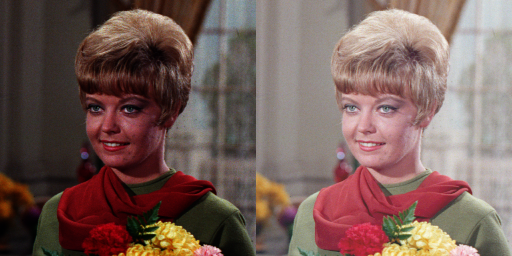

In [ ]:
print(' Gamma Correction pada citra ')
print('----------------------------------')
try:
  gamma = int(input('Masukkan nilai Gamma: '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK/Images/female.tiff')
gamma_image = np.zeros(original.shape, original.dtype)

# Akses per pixel
for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      gamma_image[y,x,c] = 255*(original[y,x,c]/255)**(1/gamma)

final_frame = cv.hconcat([original, gamma_image])
cv2_imshow(final_frame)

## Soal 2 - Simulasi image Depth

2. Buat Simulasi Image Depth Percobaan ini digunakan sebagai simulasi dari proses kuantisasi citra. Pada kuantisasi citra, pixel dapat direpresentasikan dengan n-bit kedalaman (default menggunakan 8-bit). Pada pixel 8-bit, warna yang memungkinkan adalah 256 warna, dari 0 (0000 0000) hingga 255(1111 1111). Pada pixel 7-bit, warna yang memungkinkan adalah 128 warna, dari 0 (0000000) hingga 127 (111 1111). Kemungkinan warna didapat dari pangkat 2 jumlah bit. Jika 7bit, maka jumlah warnanya adalah 27 = 128, dst.

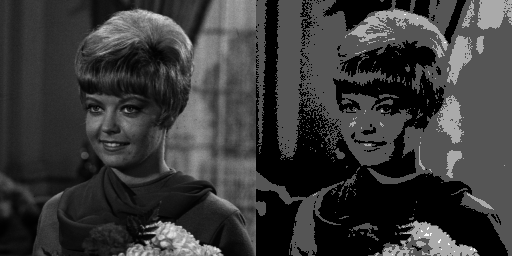

In [ ]:
bit_depth=2
level = 255 / (pow(2,bit_depth)-1)
original = cv.imread('/content/drive/MyDrive/PCVK/Images/female.tiff', cv.IMREAD_GRAYSCALE)
depth_image = np.zeros(original.shape, original.dtype)

# Akses per pixel
for y in range(original.shape[0]):
  for x in range(original.shape[1]):
      depth_image[y,x] = round(original[y,x]/level)*level

final_frame = cv.hconcat([original, depth_image])
cv2_imshow(final_frame)

## Soal 3 - Modul Average Denoising

3. Buat modul Average Denoising
Buat modul average denoising sesuai dengan rumus yang telah diberikan pada sub bab sebelumnya. Citra asli sudah disediakan pada /images/galaxy.jpg. 100 Citra dengan Gaussian Noise sudah disediakan pada /images/noises/*.jpg Anda dapat menggunakan code berikut untuk membaca semua image dalam satu folder , gunakan modul glob (import glob).


Proses denoising dengan 5 citra noise...
Nilai PSNR dengan 5 citra adalah: 27.53 (dB)


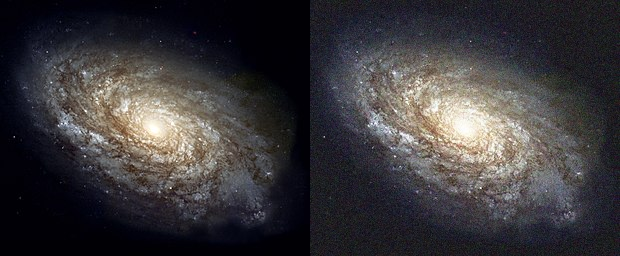


Proses denoising dengan 10 citra noise...
Nilai PSNR dengan 10 citra adalah: 27.55 (dB)


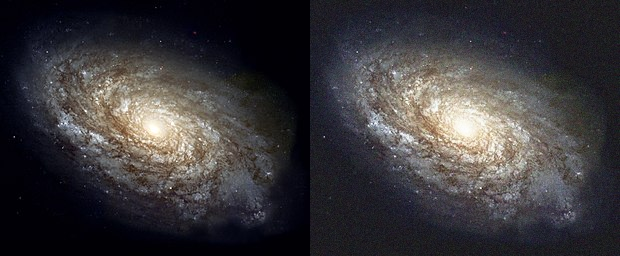


Proses denoising dengan 20 citra noise...
Nilai PSNR dengan 20 citra adalah: 27.54 (dB)


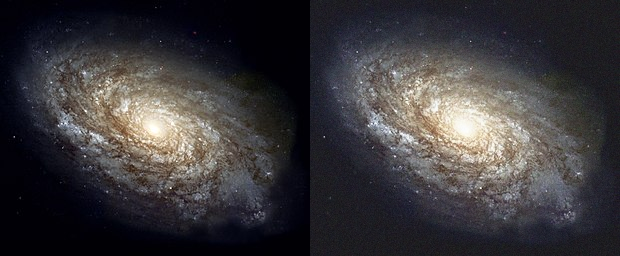


Proses denoising dengan 40 citra noise...
Nilai PSNR dengan 40 citra adalah: 27.51 (dB)


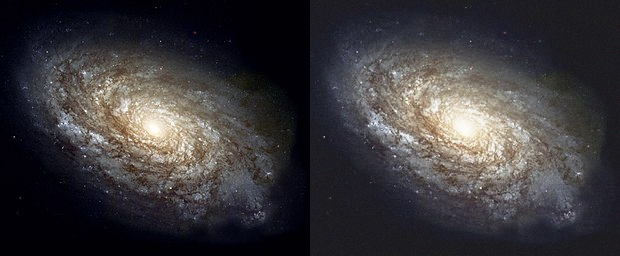


Proses denoising dengan 80 citra noise...
Nilai PSNR dengan 80 citra adalah: 27.50 (dB)


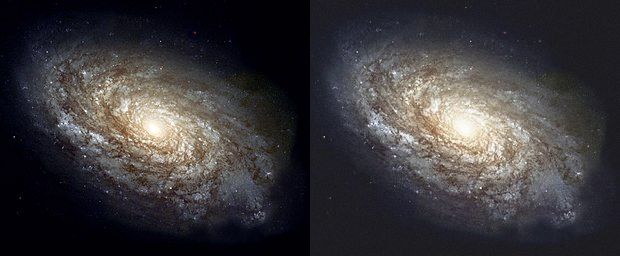


Proses denoising dengan 100 citra noise...
Nilai PSNR dengan 100 citra adalah: 27.52 (dB)


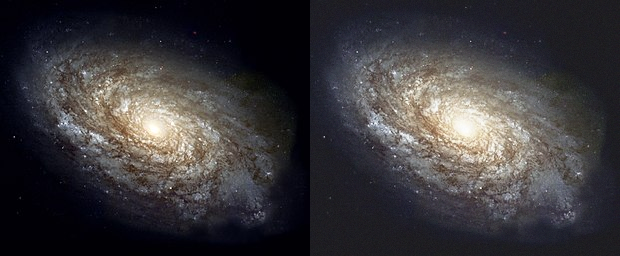


Hasil PSNR untuk masing-masing jumlah citra noise:
5 citra berisik: PSNR = 27.53 dB
10 citra berisik: PSNR = 27.55 dB
20 citra berisik: PSNR = 27.54 dB
40 citra berisik: PSNR = 27.51 dB
80 citra berisik: PSNR = 27.50 dB
100 citra berisik: PSNR = 27.52 dB


In [2]:
import cv2
import glob

def proses_denoising(original_path, noisy_images_path, noise_number):
    # Membaca gambar asli
    original = cv2.imread(original_path)

    # Membaca gambar dengan noise
    cv_img = []
    for img_path in noisy_images_path:
        n = cv2.imread(img_path)
        cv_img.append(n)

    # Proses denoising dengan gambar pertama sebagai dasar
    dst = cv_img[0]
    for i in range(noise_number):
        if i == 0:
            pass
        else:
            alpha = 1.0 / (i + 1)
            beta = 1.0 - alpha
            dst = cv2.addWeighted(cv_img[i], alpha, dst, beta, 0.0)

    # Fungsi untuk menghitung PSNR
    def PSNR(original, compressed):
        mse = np.mean((original - compressed) ** 2)
        if mse == 0:
            return 100
        max_pixel = 255.0
        psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
        return psnr

    # Menghitung nilai PSNR
    psnr_value = PSNR(original, dst)
    print(f'Nilai PSNR dengan {noise_number} citra adalah: {psnr_value:.2f} (dB)')

    # Menampilkan gambar asli dan hasil denoising berdampingan
    galaxy_frame = cv2.hconcat([original, dst])
    cv2_imshow(galaxy_frame)

    return dst, psnr_value

# Path ke gambar asli dan gambar dengan noise
original_path = '/content/drive/MyDrive/PCVK/Images/galaxy.jpg'
noisy_images_path = glob.glob('/content/drive/MyDrive/PCVK/Images/noises/*.jpg')

# Jumlah gambar noise yang akan digunakan untuk proses denoising
noise_numbers = [5, 10, 20, 40, 80, 100]  # Daftar jumlah citra yang akan digunakan

# Melakukan proses denoising untuk setiap jumlah gambar noise
psnr_results = {}
for noise_number in noise_numbers:
    print(f'\nProses denoising dengan {noise_number} citra noise...')
    _, psnr = proses_denoising(original_path, noisy_images_path, noise_number)
    psnr_results[noise_number] = psnr

# Menampilkan hasil PSNR
print("\nHasil PSNR untuk masing-masing jumlah citra noise:")
for num, psnr in psnr_results.items():
    print(f'{num} citra berisik: PSNR = {psnr:.2f} dB')


Dengan menggunakan code diatas. anda tinggal memanggil image difolder tersebut menggunakan cv_img[0], cv_img[1], dst.

**Jawab** : Dari hasil PSNR yang tercatat, kesimpulan yang dapat diambil adalah bahwa semakin banyak citra dengan noise yang digunakan untuk proses average denoising, kualitas gambar hasil denoising cenderung meningkat, yang ditunjukkan oleh nilai PSNR yang lebih tinggi. Artinya, metode average denoising menjadi lebih efektif ketika menggunakan lebih banyak citra, karena lebih banyak noise dapat dihilangkan melalui proses penggabungan. Namun, setelah titik tertentu, peningkatan PSNR mungkin akan semakin kecil, menunjukkan bahwa ada batasan seberapa efektif metode ini dalam meningkatkan kualitas gambar.

## 4. Masking Image KTP

4. Buat image masking untuk image berikut. Image kiri adalah image asli (image KTP),
sedangkan image paling kanan adalah hasilnya:

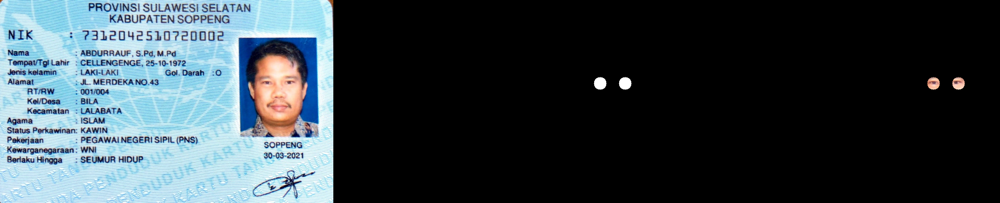

In [ ]:
image_ktp = cv.imread('/content/drive/MyDrive/PCVK/Images/KTP_More/KTP_More/KTP7.jpeg')

# Membuat mask kosong
mask_4 = np.zeros(image_ktp.shape, dtype=np.uint8)

# Menentukan yang ak50 di-mask
cv.circle(mask_4, (640, 200), 15, (255, 255, 255), -1)
cv.circle(mask_4, (700, 200), 15, (255, 255, 255), -1)

# Melakukan masking
masked_image = cv.bitwise_and(image_ktp, mask_4)

# Menampilkan hasil
final_frame = cv.hconcat([image_ktp, mask_4, masked_image])
cv2_imshow(final_frame)

## 5. Masking NOT, OR, AND, NAND, XOR

5. Lakukan percobaan menggunakan operator lain dan tunjukkan hasilnya pada modul ini. Tuliskan hasil analisa anda kenapa citra keluarannya seperti itu.

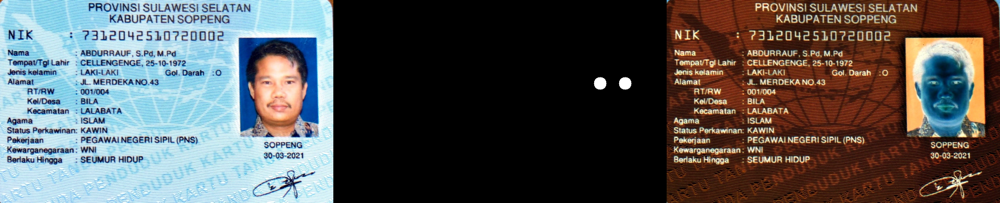

In [ ]:
mask_not = np.zeros(image_ktp.shape, dtype=np.uint8)

# Menentukan yang akan di-mask
cv.circle(mask_not, (640, 200), 15, (255, 255, 255), -1)
cv.circle(mask_not, (700, 200), 15, (255, 255, 255), -1)

# Melakukan masking
masked_not_image = cv.bitwise_not(image_ktp)

# Menampilkan hasil
final_frame = cv.hconcat([image_ktp, mask_not, masked_not_image])
cv2_imshow(final_frame)

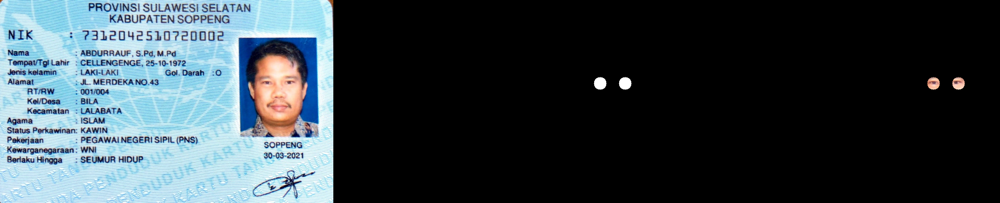

In [ ]:
mask_and = np.zeros(image_ktp.shape, dtype=np.uint8)

# Menentukan yang akan di-mask

cv.circle(mask_and, (640, 200), 15, (255, 255, 255), -1)
cv.circle(mask_and, (700, 200), 15, (255, 255, 255), -1)

# Melakukan masking
masked_image = cv.bitwise_and(image_ktp, mask_and)

# Menampilkan hasil
final_frame = cv.hconcat([image_ktp, mask_and, masked_image])
cv2_imshow(final_frame)

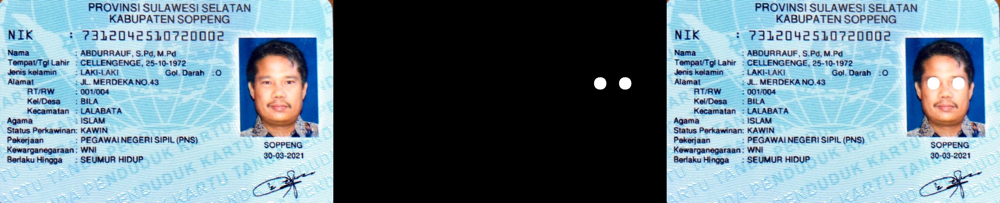

In [ ]:
mask_or = np.zeros(image_ktp.shape, dtype=np.uint8)

# Menentukan yang akan di-mask
cv.circle(mask_or, (640, 200), 15, (255, 255, 255), -1)
cv.circle(mask_or, (700, 200), 15, (255, 255, 255), -1)

# Melakukan masking
masked_image = cv.bitwise_or(image_ktp, mask_or)

# Menampilkan hasil
final_frame = cv.hconcat([image_ktp, mask_or, masked_image])
cv2_imshow(final_frame)

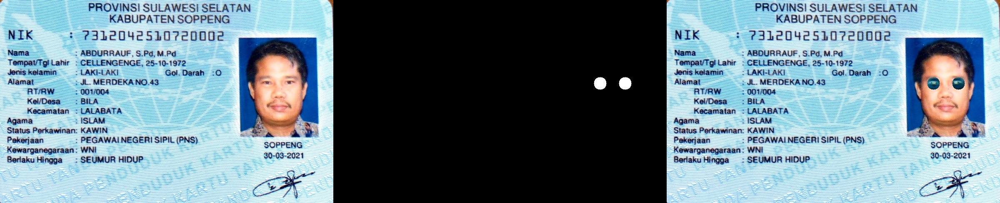

In [ ]:
mask_xor = np.zeros(image_ktp.shape, dtype=np.uint8)

# Menentukan yang akan di-mask
cv.circle(mask_xor, (640, 200), 15, (255, 255, 255), -1)
cv.circle(mask_xor, (700, 200), 15, (255, 255, 255), -1)

# Melakukan masking
masked_image = cv.bitwise_xor(image_ktp, mask_xor)

# Menampilkan hasil
final_frame = cv.hconcat([image_ktp, mask_xor, masked_image])
cv2_imshow(final_frame)

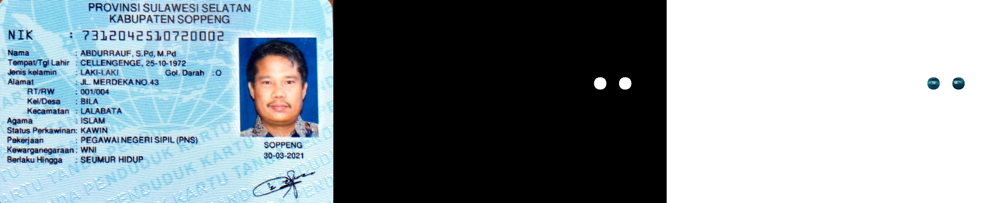

In [ ]:
mask_nand = np.zeros(image_ktp.shape, dtype=np.uint8)

# Menentukan yang akan di-mask
cv.circle(mask_nand, (640, 200), 15, (255, 255, 255), -1)
cv.circle(mask_nand, (700, 200), 15, (255, 255, 255), -1)

# Melakukan masking
masked_image = cv.bitwise_not(cv.bitwise_and(image_ktp, mask_nand))

# Menampilkan hasil
final_frame = cv.hconcat([image_ktp, mask_nand, masked_image])
cv2_imshow(final_frame)